# 第十三次课-课后练习

本次作业是课后练习，供大家熟练课堂上讲授的基础知识点，不计入任何分数。

请将作业命名为 HW13-课后练习+姓名+学号.ipynb

本次作业内容较多，但大部分以阅读运行代码为主，需要补充的部分技术难度并不大或能通过直接调用库函数完成，希望不会给大家期中季增加太多负担

OpenCV的官方文档中关于函数接口的部分使用的是C++的函数格式，Python接口的输入输出格式说明并不详细；因此如果在阅读过程中遇到困难，可以自行查阅其他资料或在课程群内交流讨论

In [1]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline

## 一、图像处理基本操作

本部分**无需填写代码**，阅读并理解运行结果即可。

### 1.1 图片读取与显示

uint8 255
<class 'numpy.ndarray'>
(512, 512, 3)


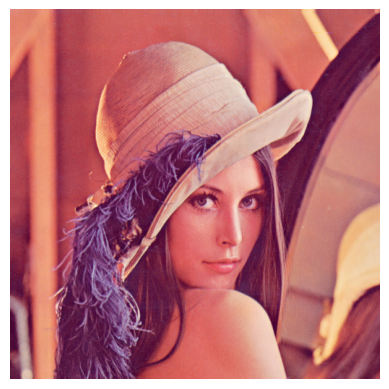

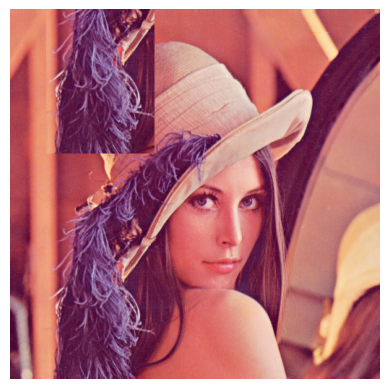

In [6]:
lena_path = './HW13-imgs/lena.jpg'
lena = cv2.imread(lena_path)

# cv2默认读取的图片是BGR，需要转换成RGB
lena_uint = cv2.cvtColor(lena, cv2.COLOR_BGR2RGB)

# cv2读取的图片是uint8类型，范围为0-255
print(lena.dtype, np.max(lena)) 

# 通常会转换为0-1浮点型数据
# 但cv2中有的函数接口需要0-255的uint8整型数据
# 因此调用函数前需注意格式转换问题
lena = lena_uint / 255.0

# 查看图片的类型和形状
print(type(lena))   # 类型为np.ndarray
print(lena.shape)

# 用plt显示整张图片
plt.imshow(lena)
plt.axis('off')
plt.show()

# 用ndarray的操作对图片进行变换
# 将图片一部分移动到另一部分
lena_new = lena.copy()
lena_new[0: 200, 50: 200, :] = lena_new[300: 500, 50: 200, :]
plt.imshow(lena_new)
plt.axis('off')
plt.show()

### 1.2 灰度变换

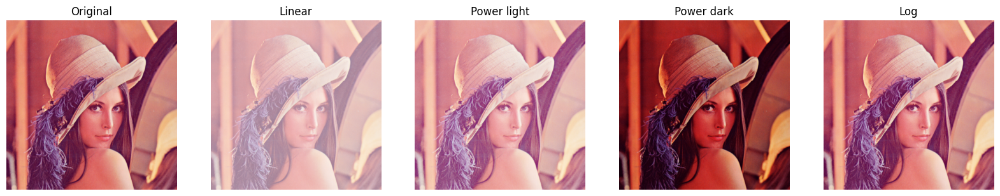

In [7]:
plt.figure(figsize=(20, 4))

plt.subplot(1, 5, 1)
plt.title('Original')
plt.imshow(lena)
plt.axis('off')

# 使用线性变换进行亮度调整
linear_lena = 0.5 * lena + 0.5
plt.subplot(1, 5, 2)
plt.title('Linear')
plt.imshow(linear_lena)
plt.axis('off')

# 使用幂律变换进行亮度调整
# 幂次小于1，则图像变亮，大于1，图像变暗
power_lena = np.power(lena, 0.5)
plt.subplot(1, 5, 3)
plt.title('Power light')
plt.imshow(power_lena)
plt.axis('off')

power_lena = np.power(lena, 2)
plt.subplot(1, 5, 4)
plt.title('Power dark')
plt.imshow(power_lena)
plt.axis('off')

# 使用对数变换进行亮度调整
log_lena = np.log(lena + 1) / np.log(2)
plt.subplot(1, 5, 5)
plt.title('Log')
plt.imshow(log_lena)
plt.axis('off')
plt.show()

## 1.3 直方图提取与均衡化

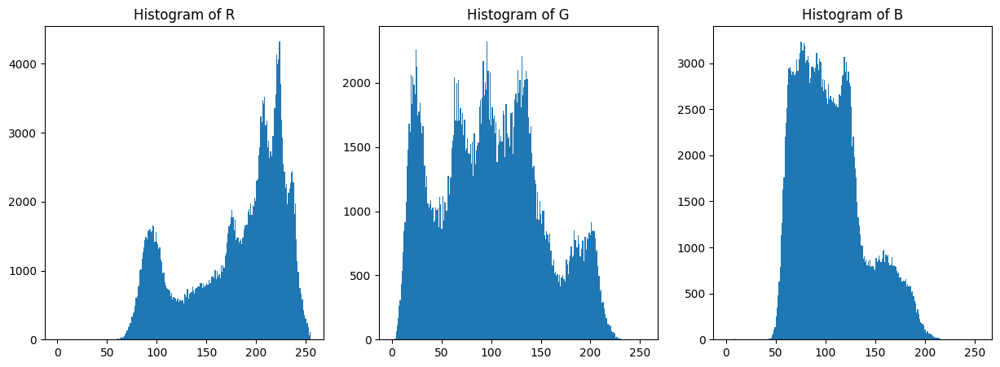

In [9]:
lena_r, lena_g, lena_b = cv2.split(lena_uint)
hist_r = cv2.calcHist([lena_r], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([lena_g], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([lena_b], [0], None, [256], [0, 256])
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Histogram of R')
plt.hist(range(256), weights=hist_r, bins=256)
plt.subplot(1, 3, 2)
plt.title('Histogram of G')
plt.hist(range(256), weights=hist_g, bins=256)
plt.subplot(1, 3, 3)
plt.title('Histogram of B')
plt.hist(range(256), weights=hist_b, bins=256)
plt.show()

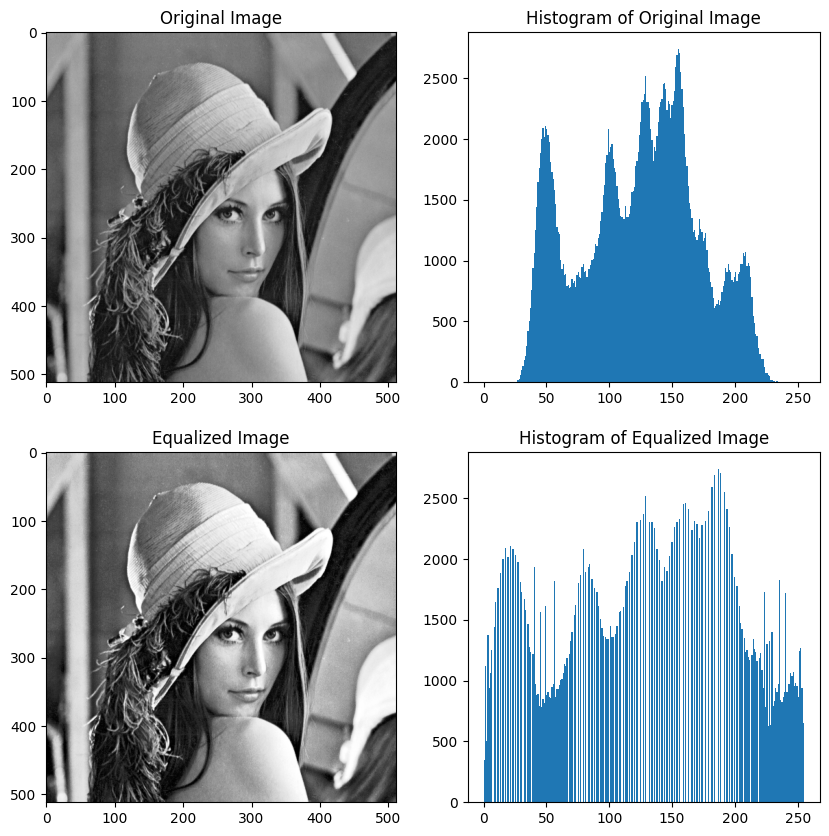

In [10]:
# 直方图均衡化需转为灰度图
lena_uint_gray = cv2.cvtColor(lena_uint, cv2.COLOR_RGB2GRAY)
hist_origin = cv2.calcHist([lena_uint_gray], [0], None, [256], [0, 256])
equalized_gray = cv2.equalizeHist(lena_uint_gray)
hist_equalized = cv2.calcHist([equalized_gray], [0], None, [256], [0, 256])

plt.figure(figsize=(10, 10))
plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(lena_uint_gray, cmap='gray')
plt.subplot(2, 2, 2)
plt.title('Histogram of Original Image')
plt.hist(range(256), weights=hist_origin, bins=256)
plt.subplot(2, 2, 3)
plt.title('Equalized Image')
plt.imshow(equalized_gray, cmap='gray')
plt.subplot(2, 2, 4)
plt.title('Histogram of Equalized Image')
plt.hist(range(256), weights=hist_equalized, bins=256)
plt.show()

### 1.4 Canny边缘检测

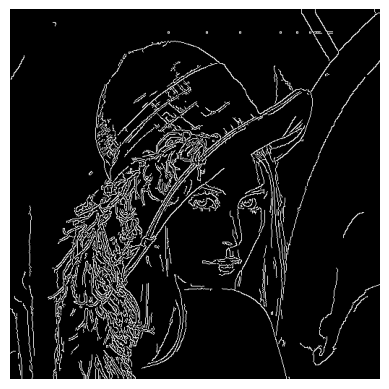

In [11]:
canny_lena = cv2.Canny(lena_uint, 100, 200)
plt.imshow(canny_lena, cmap='gray')
plt.axis('off')
plt.show()

## 二、基于卷积的图像处理

可以用[`cv2.filter2D`](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04)实现二维卷积。

以下是一个使用box filter实现图像模糊的例子，你可以通过模仿这个例子中`cv2.filter2D`函数的用法，来实现其他基于卷积操作的图像处理方法。

In [12]:
# 该函数用于快捷绘图，你可以自由修改使之符合你的需求或绘图习惯
def show_imgs(imgs, titles=None, figsize=(10, 5), arangement=None, cmap=None, **kwargs):
    '''
    Input:
        imgs: 要显示的图像列表，可以含有None表示不绘制相应位置的图像
        titles: 对应每张图像的标题列表
        figsize: 整张图像的尺寸
        arangement: 图像排列方式，是一个整数二元组，如(2, 3)，含义是subplot的前两个参数 
                    如果设为None，则默认为(1, len(imgs))
    '''
    assert type(imgs) == list
    n_imgs = len(imgs)
    if arangement is None:
        arangement = (1, n_imgs)
    assert type(arangement) == tuple
    assert n_imgs <= arangement[0] * arangement[1]

    if titles is None or len(titles) != n_imgs:
        titles = [''] * n_imgs
    plt.figure(figsize=figsize)
    for i in range(n_imgs):
        if imgs[i] is None:
            continue
        plt.subplot(arangement[0], arangement[1], i + 1)
        plt.imshow(imgs[i], cmap=cmap)
        plt.title(titles[i])
        plt.axis('off')

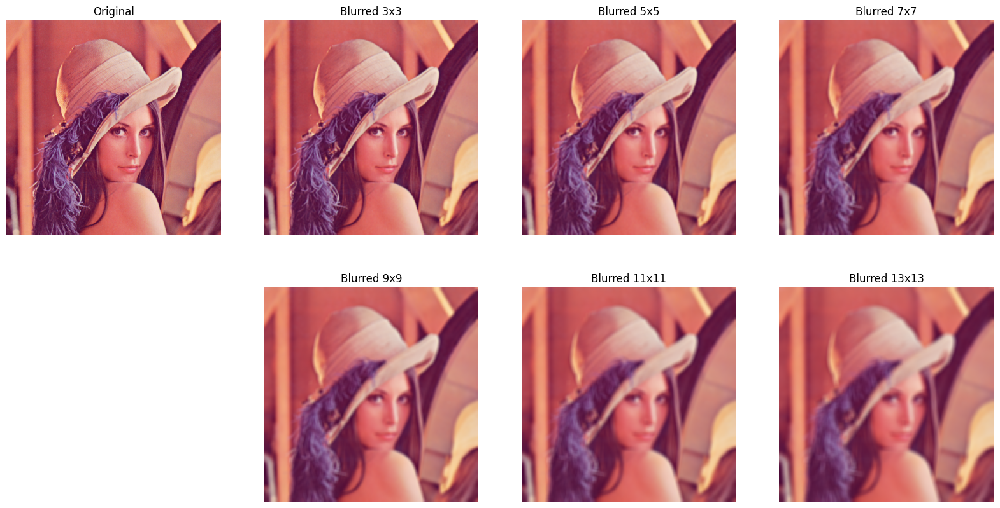

In [13]:
# 使用box filter实现图像模糊，同时也可以通过这个例子熟悉上面的绘图代码接口
box_filters = [np.ones((i, i)) / (i * i) for i in [3, 5, 7, 9, 11, 13]]
blurred_titles = [f'Blurred {i}x{i}' for i in [3, 5, 7, 9, 11, 13]]
box_blurred_lena = [np.clip(cv2.filter2D(lena, -1, box_filter), 0, 1) for box_filter in box_filters]
show_imgs(
    imgs = [lena] + box_blurred_lena[:3] + [None] + box_blurred_lena[3:],
    titles = ['Original'] + blurred_titles[:3] + [None] + blurred_titles[3:],
    figsize = (20, 10),
    arangement = (2, 4)
)

### 2.1 高斯模糊

用以下两种方式实现对图像的高斯模糊操作，模糊核尺寸和方差可自行任意设置，以对比不同尺寸和方差的模糊效果
- 直接使用[`cv2.GaussianBlur`](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1)函数
- 使用[`cv2.getGaussianKernel`](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gac05a120c1ae92a6060dd0db190a61afa)函数获取高斯核，并使用`cv2.filter2D`函数对图像进行卷积操作

简单起见，可以认为在X和Y方向上高斯核的大小和方差均相同

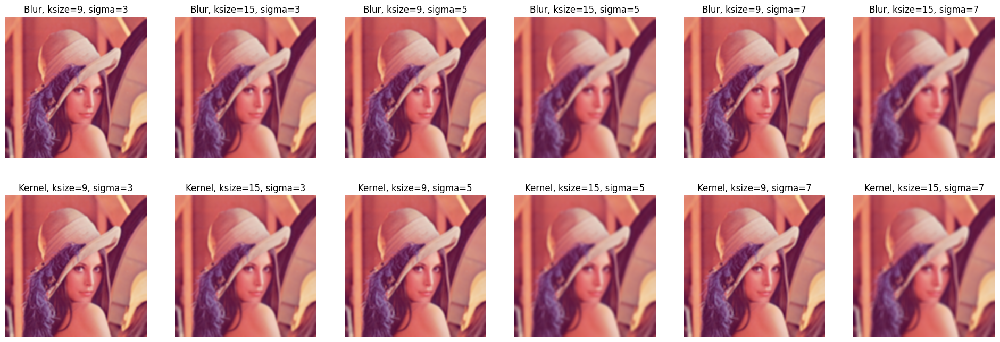

In [20]:
def use_GaussianBlur(img, kernel_size, sigma):
    # -------------------------------------------------------------
    # TODO: 使用cv2.GaussianBlur函数实现高斯模糊
    return cv2.GaussianBlur(img, kernel_size, sigma)
    # -------------------------------------------------------------

def use_GaussianKernel(img, kernel_size, sigma):
    # -------------------------------------------------------------
    # TODO: 使用cv2.getGaussianKernel函数实现高斯模糊
    # 这个函数得到的是一维高斯核，将它乘以本身的转置可得二维高斯核
    pass
    # -------------------------------------------------------------

params = {
    'kernel_size': [9, 15, 9, 15, 9, 15],  
    'sigma': [3, 3, 5, 5, 7, 7]
}   # Or change to any values you want to try

img_GaussianBlur = []
img_GaussianKernel = []
title_GaussianBlur = []
title_GaussianKernel = []

for kernel_size, sigma in zip(params['kernel_size'], params['sigma']):
    lena_GaussianBlur = use_GaussianBlur(lena, kernel_size, sigma)
    img_GaussianBlur.append(lena_GaussianBlur)
    title_GaussianBlur.append(f'Blur, ksize={kernel_size}, sigma={sigma}')
    lena_GaussianKernel = use_GaussianKernel(lena, kernel_size, sigma)
    img_GaussianKernel.append(lena_GaussianKernel)
    title_GaussianKernel.append(f'Kernel, ksize={kernel_size}, sigma={sigma}')

show_imgs(
    img_GaussianBlur + img_GaussianKernel, 
    titles = title_GaussianBlur + title_GaussianKernel,
    figsize = (len(img_GaussianKernel) * 4, 8),
    arangement = (2, len(img_GaussianKernel))
)    

### 2.2 梯度算子

使用Sobel算子与图像进行卷积可用于获得图像梯度，梯度信息可用于边缘检测和特征提取等。Sobel算子有两种，分别对应于X和Y方向上的梯度
$$
S_x = \left[
    \begin{matrix}
    -1 & 0 & 1 \\ 
    -2 & 0 & 2 \\ 
    -1 & 0 & 1 
    \end{matrix}
\right],\quad
S_y = \left[
    \begin{matrix}
    1 & 2 & 1 \\ 
    0 & 0 & 0 \\ 
    -1 & -2 & -1 
    \end{matrix}
\right]
$$

使用Laplacian算子可用于提取图像的二阶微分，也即$\Delta I = \nabla\cdot\nabla I = \dfrac{\partial^2 I}{\partial x^2} + \dfrac{\partial^2 I}{\partial y^2}$，Laplacian算子也有两种：
$$
L_1 = \left[
    \begin{matrix}
    0 & 1 & 0 \\ 
    1 & -4 & 1 \\ 
    0 & 1 & 0 
    \end{matrix}
\right],\quad
L_2 = \left[
    \begin{matrix}
    1 & 1 & 1 \\ 
    1 & -8 & 1 \\ 
    1 & 1 & 1 
    \end{matrix}
\right]
$$

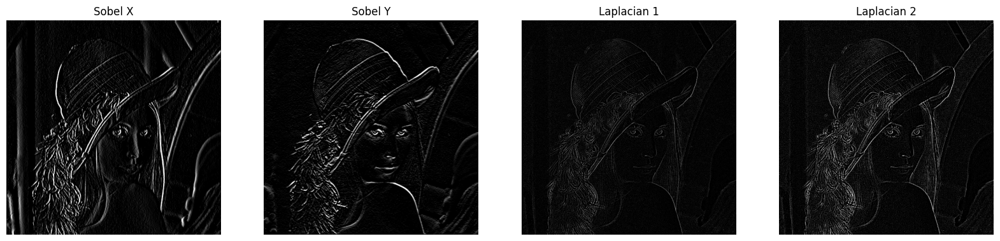

In [21]:
img = lena_uint_gray
# -------------------------------------------------------------
# TODO: 使用以上提到的四个核分别作用在lena灰度图片上并绘图展示
# -------------------------------------------------------------

## 三、Harris-Stephens角点检测

我们直观认为角是曲线方向的迅速变化，也即下图的第三种情况。Harris-Stephens角点检测的思想为，对于图像上以某个点为中心的一个小框
- 如果朝向任意方向移动一小步，框内灰度情况基本不变，则认为该点位于灰度平坦处(左)
- 如果朝向某个方向移动，发现框内灰度情况基本不变，但朝向与其正交方向移动时，灰度变化较大，说明该点在一个边上(中)
- 如果朝任意方向移动，框内灰度情况都发生较大变化，说明该点是一个角点(右)

![Alternative Text][1713076242278]

[1713076242278]: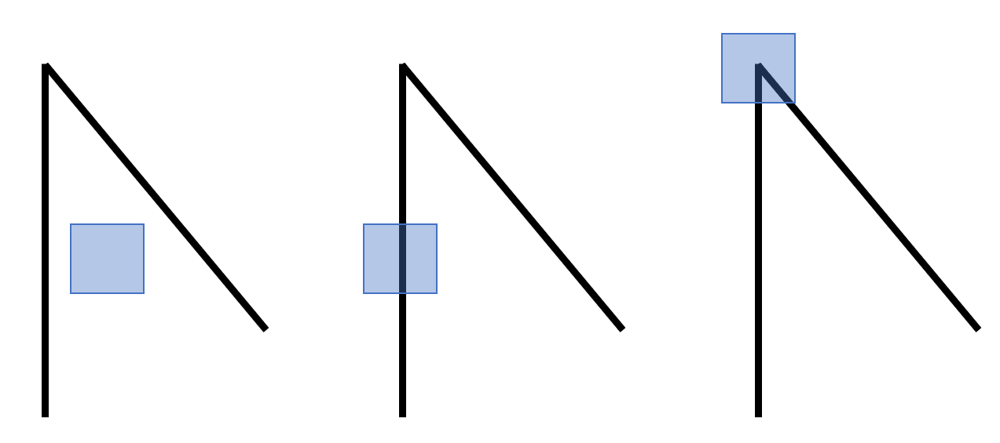

以下我们将逐步实现Harris-Stephens角点算法

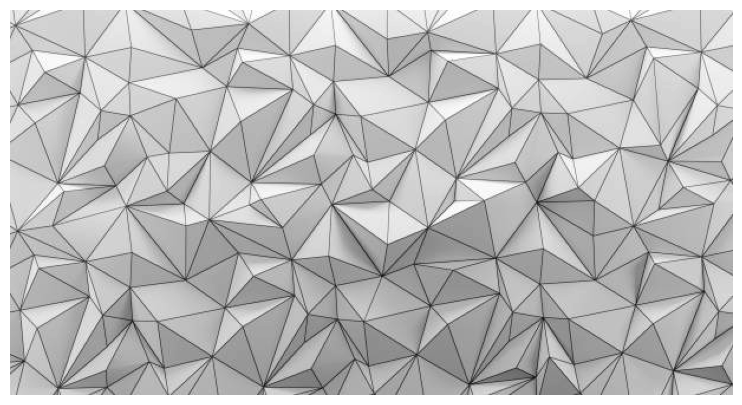

In [23]:
img_path = './HW13-imgs/polygons.jpg'
img = cv2.imread(img_path, 0) / 255.0   # 设置0表示读取灰度图
plt.figure(figsize=(10, 5))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

### Step 1 梯度计算

使用Sobel算子与图像进行卷积，得到X和Y方向上的梯度$I_x$和$I_y$

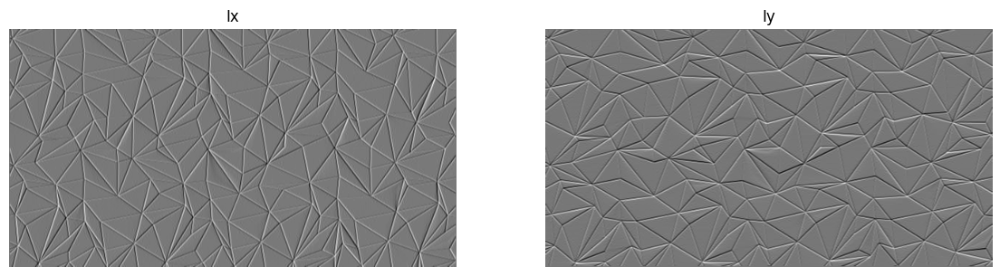

In [24]:
# -------------------------------------------------------------
# TODO: 计算Ix和Iy
# Ix = ...
# Iy = ...
# -------------------------------------------------------------
show_imgs([Ix, Iy], titles=['Ix', 'Iy'], figsize=(14, 5), cmap='gray')

计算$I_{xx} = I_x \cdot I_x$, $I_{yy} = I_y \cdot I_y$和$I_{xy} = I_x \cdot I_y$，其中$\cdot$是逐元素乘法而非矩阵乘法

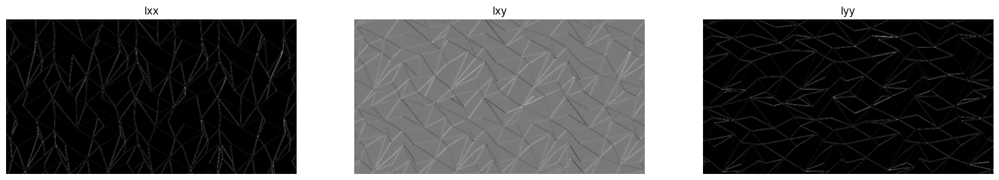

In [25]:
# -------------------------------------------------------------
# TODO: 计算Ixx、Ixy和Iyy
# Ixx = ...
# Ixy = ...
# Iyy = ...

# -------------------------------------------------------------
show_imgs([Ixx, Ixy, Iyy], titles=['Ixx', 'Ixy', 'Iyy'], figsize=(21, 5), cmap='gray')

使用高斯平滑减少噪声

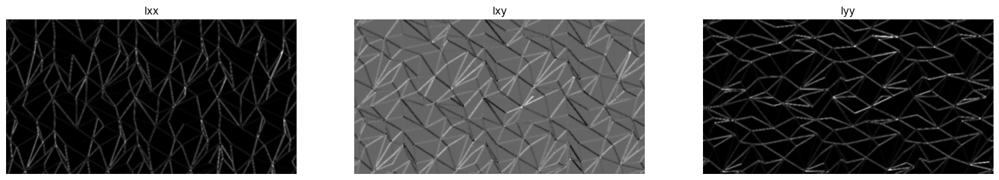

In [26]:
Ixx = use_GaussianBlur(Ixx, 5, 1)
Iyy = use_GaussianBlur(Iyy, 5, 1)
Ixy = use_GaussianBlur(Ixy, 5, 1)
show_imgs(
    [Ixx, Ixy, Iyy], 
    titles=['Ixx', 'Ixy', 'Iyy'], figsize=(21, 5), cmap='gray'
)

### Step 2. 为每个点计算$R$值

令$A_{ij}$表示在$(i,j)$处的局部特征矩阵，定义为
$$
A_{ij} = \left[
    \begin{matrix}
        I_{xx, ij} & I_{xy, ij}\\
        I_{xy, ij} & I_{yy, ij}
    \end{matrix}
\right]
$$
则$(i,j)$处的$R$值定义为$R_{ij}=\mathrm{det}(A_{ij}) - k \mathrm{trace}(A_{ij})^2$，其中$k$为可调节的常数，$\mathrm{det}$表示矩阵的行列式，$\mathrm{trace}$表示矩阵的迹

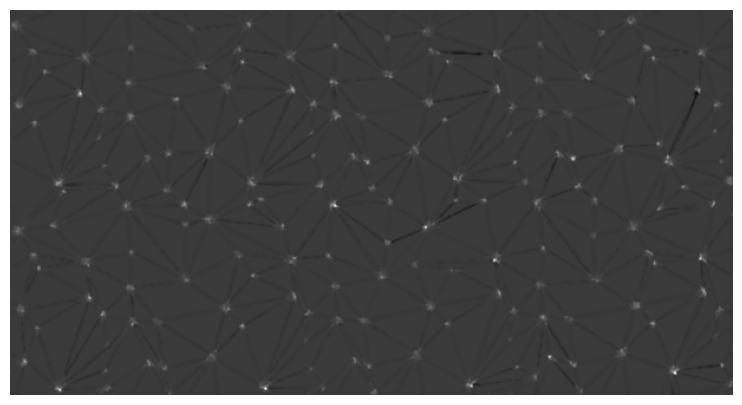

In [27]:
# -------------------------------------------------------------
# TODO: 计算R值矩阵，参数k设置为0.04
# 可以进行进一步推导实现向量化操作
# 使用两重for循环给R赋值也可以接受
# 可以用np.linalg.det求矩阵行列式，np.trace求矩阵的迹
# R = ...
# -------------------------------------------------------------
assert R.shape == img.shape
plt.figure(figsize=(10, 5))
plt.imshow(R, cmap='gray')
plt.axis('off')
plt.show()

### Step 3. 直接取出$R$中大于阈值的部分作为角点，查看效果

In [28]:
threshold = R.max() / 5
corners = np.where(R > threshold)
corners[0].shape

(948,)

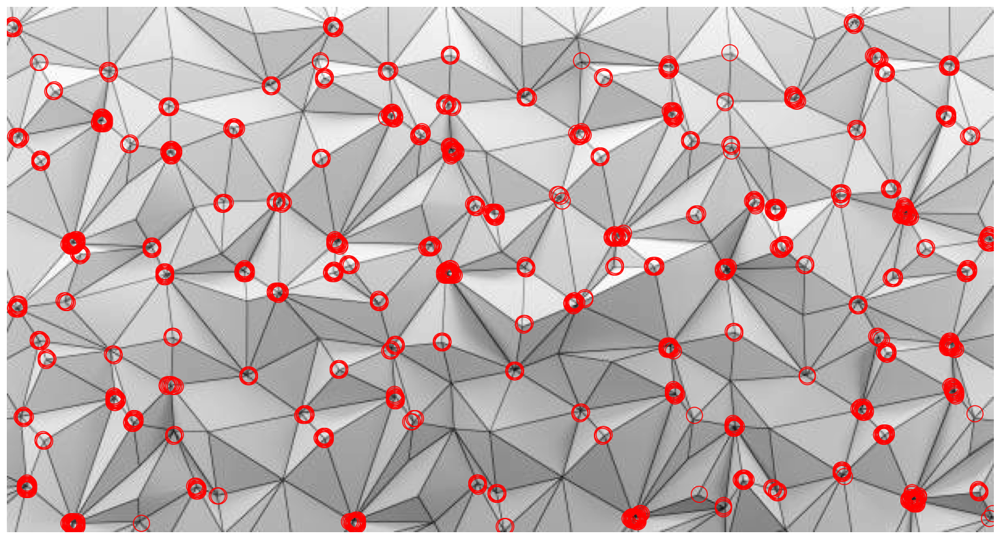

In [29]:
from matplotlib.patches import Circle
plt.figure(figsize=(20, 10))
plt.imshow(img, cmap='gray')
plt.axis('off')

for x, y in zip(corners[0], corners[1]):
    circle = Circle((y, x), 5, fill=False, linewidth=1, edgecolor='r')
    plt.gca().add_patch(circle)

plt.show()

### Step 4. 非极大值抑制(NMS)

可以发现，在某些角点处，使用Harris-Stephens得到的角点非常密集，因此需要进行非极大值抑制，使得一个小局部只包含一个角点特征，非极大值抑制的一个最简单做法是，依次遍历$R$值较大的一些角点，以之为中心画一个k×k的窗口，如果该点的$R$值并非窗口内最大值，则将这个点的$R$值赋为0(或负无穷，或符合应用要求的足够小的值)

In [30]:
R_NMS = R.copy()
threshold = R_NMS.max() / 20
corners = np.where(R_NMS > threshold)

for i, j in zip(corners[0], corners[1]):

    # 窗口大小设置为9x9，
    min_i = max(0, i - 4)
    max_i = min(i + 5, R.shape[0])
    min_j = max(0, j - 4)
    max_j = min(j + 5, R.shape[1])
    # -------------------------------------------------------------
    # TODO: 在R_NMS矩阵上进行非极大值抑制，非极大则赋值为0
    pass
    # -------------------------------------------------------------



In [31]:
threshold = R_NMS.max() / 20
corners = np.where(R_NMS > threshold)
corners[0].shape

(218,)

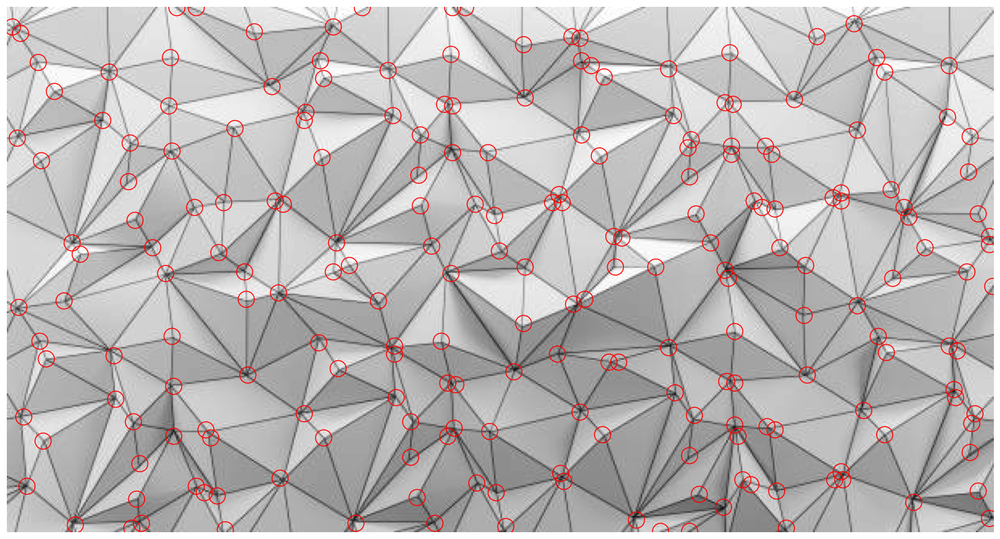

In [32]:
from matplotlib.patches import Circle
plt.figure(figsize=(20, 10))
plt.imshow(img, cmap='gray')
plt.axis('off')
for x, y in zip(corners[0], corners[1]):
    circle = Circle((y, x), 5, fill=False, linewidth=1, edgecolor='r')
    plt.gca().add_patch(circle)

plt.show()

## 四、特征匹配

本部分**无需填充代码**，了解API的调用过程和效果即可

In [33]:
img1_path = './HW13-imgs/sift1.jpg'
img2_path = './HW13-imgs/sift2.jpg'
img1 = cv2.imread(img1_path)
img2 = cv2.imread(img2_path)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

### 4.1. SIFT特征提取

In [34]:
def get_SIFT(img):
    sift = cv2.SIFT_create()
    # 如果以上代码报错请尝试使用下面这行
    # sift = cv2.xfeatures2d.SIFT_create()

    kp, des = sift.detectAndCompute(img, None)
    # kp是一个长为N的tuple，每个元素为cv2.KeyPoint类型
    # des是一个N*128的矩阵，每一行是对应于kp的描述子
    return kp, des

kp1, des1 = get_SIFT(img1_gray)
kp2, des2 = get_SIFT(img2_gray)

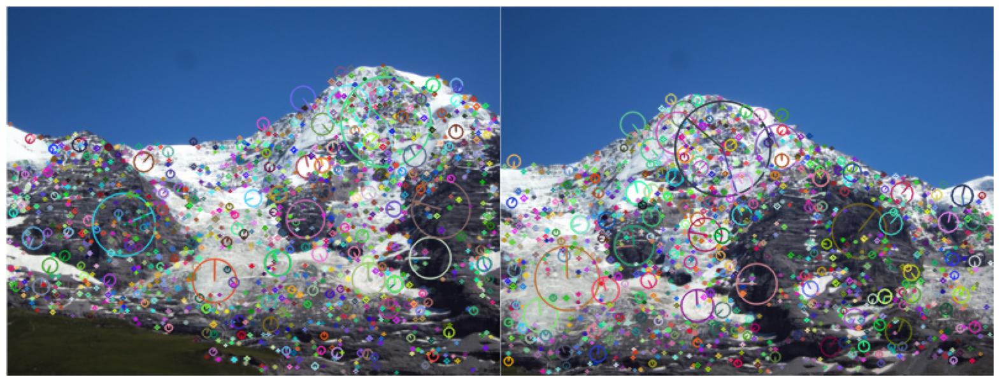

In [35]:
def get_plot_sift(img, kp):
    return cv2.drawKeypoints(img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(20, 10))
img_with_kp1 = get_plot_sift(img1, kp1)
img_with_kp2 = get_plot_sift(img2, kp2)
img_with_kp = np.concatenate((img_with_kp1, img_with_kp2), axis=1)
plt.imshow(img_with_kp)
plt.axis('off')
plt.show()

### 4.2. 特征匹配

设使用SIFT在两张图片上得到的特征集合分别为$\mathcal{F}_1$和$\mathcal{F}_2$，则对于任意的$f_1\in \mathcal{F}_1$和$f_2\in\mathcal{F}_2$，定义他们的距离为$D(f_1,f_2)$

如果对于某个$f_1\in \mathcal{F}_1$，存在一个$\tilde{f}_2\in \mathcal{F}_2$，使得$D(f_1,\tilde{f}_2) < t\min_{f_2 \neq \tilde{f}_2} D(f_1,f_2)$，则认为$f_1$和$f_2$是匹配的

以下代码用于提取相匹配的特征点的坐标，得到一个$(N, 4)$的numpy数组，其中$N$是匹配的数量，每一行的数据$(x_1,y_1,x_2,y_2)$表示匹配的$f_1$和$f_2$在各自图片中的位置

In [36]:
def matcher(kp1, des1, kp2, des2, threshold):
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good.append([m])  
    matches = []
    for pair in good:
        matches.append(kp1[pair[0].queryIdx].pt + kp2[pair[0].trainIdx].pt)
    matches = np.array(matches)
    return matches
# 这里threshold（即公式中的t）设置的很小，因此得到的匹配都可以认为是很强的匹配
# 多数情况下这样的匹配很少，可能并不足以满足实际需求的数目
# 因此实际应用中threshold会设置的稍大，获得更多的特征匹配对
# 并在后续处理中使用鲁棒性更强的算法来对抗误匹配和噪声的影响
matches = matcher(kp1, des1, kp2, des2, 0.1)
print(matches.shape)

(69, 4)


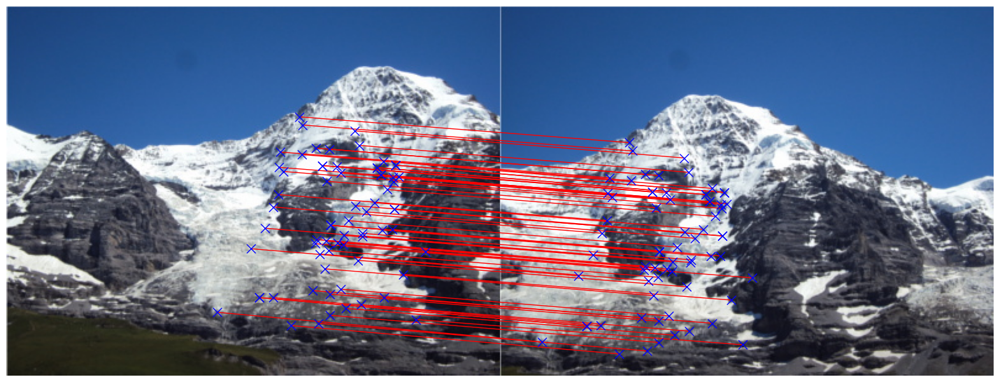

In [37]:
# 以下代码用于绘制匹配的特征点
concat_img = np.concatenate((img1, img2), axis=1)
plt.figure(figsize=(20, 10))
offset = concat_img.shape[1] / 2

plt.imshow(concat_img)
plt.plot(
    [matches[:, 0], matches[:, 2] + offset], 
    [matches[:, 1], matches[:, 3]],
    'r', linewidth=1)
plt.plot(matches[:, 0], matches[:, 1], 'xb', markersize=10)
plt.plot(matches[:, 2] + offset, matches[:, 3], 'xb', markersize=10)
plt.axis('off')
plt.show()

## 五、图像分类

本部分我们使用sklearn上的人脸数据集，提取图像HOG特征并对图像进行分类

### 准备数据

In [38]:
import cv2
import numpy as np
from sklearn.datasets import fetch_olivetti_faces

data_root = './HW13-imgs'
faces = fetch_olivetti_faces(data_home=data_root)
imgs = (faces.images * 255).astype(np.uint8)
labels = faces.target

print(imgs.shape)
print(labels.shape)


(400, 64, 64)
(400,)


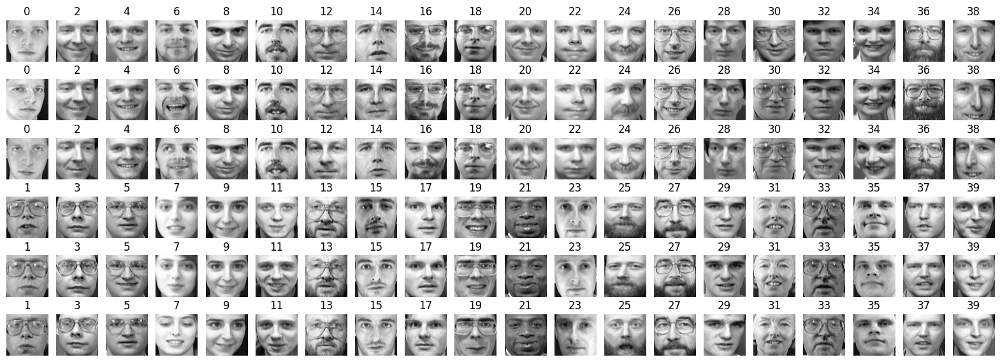

In [39]:
imgs_to_show = []
titles_to_show = []
index_to_show = list(range(0, 400, 10)) + list(range(1, 400, 10)) + list(range(2, 400, 10))
index_to_show = index_to_show[::2] + index_to_show[1::2]

for i in index_to_show:
    imgs_to_show.append(imgs[i])
    titles_to_show.append(labels[i])
show_imgs(
    imgs=imgs_to_show,
    titles=titles_to_show,
    figsize=(20, 7),
    cmap='gray',
    arangement=(6, 20)
)

### 训练集测试集划分

In [40]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
xtrain, xtest, ytrain, ytest = train_test_split(imgs,labels,test_size=0.5,stratify=labels)

### HOG特征提取

In [41]:
# -------------------------------------------------------------
# TODO: 仿照课件p69，定义一个HOG特征提取器，命名为hog_cv2
# 并提取训练集和测试集的HOG特征
# 涉及到的参数可以自由设定
# 特征维数会因参数设置而不同，不一定与参考输出一致

# -------------------------------------------------------------

feature_train = []
feature_test = []

for img in xtrain:
    feature_train.append(hog_cv2.compute(
        cv2.resize(img, winsize, interpolation=cv2.INTER_CUBIC)).reshape(-1, 1))

for img in xtest:
    feature_test.append(hog_cv2.compute(
        cv2.resize(img, winsize, interpolation=cv2.INTER_CUBIC)).reshape(-1, 1))

feature_train = np.concatenate(feature_train, axis=1).T
feature_test = np.concatenate(feature_test, axis=1).T

print(feature_train.shape, feature_test.shape)

(200, 21168) (200, 21168)


### 分类器训练

In [42]:
from sklearn.svm import SVC
# -------------------------------------------------------------
# TODO: 使用SVC分类器和训练数据feature_train和ytrain训练模型
# 并在feature_test上进行预测，结果保存在y_pred中

# -------------------------------------------------------------
print(y_pred.shape)

(200,)


Precision: 0.941, Recall: 0.915, F1-score: 0.915


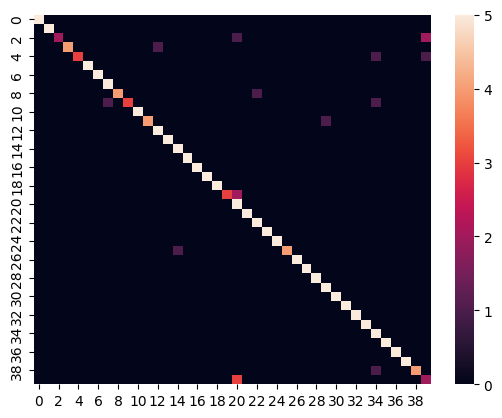

In [43]:
# 在这个任务上一般三个指标都在0.9以上，可以认为HOG特征选取的比较好
# 但本次作业中只要输出的热力图能大致看出斜率为-1的那条对角线即可，无需调参刷指标
# 把宝贵的时间留给期中吧~
import sklearn.metrics
import seaborn as sn
precision, recall, fscore, _ = sklearn.metrics.precision_recall_fscore_support(
    ytest, y_pred, average='macro')
print(f"Precision: {precision:.3f}, Recall: {recall:.3f}, F1-score: {fscore:.3f}")
confusion_matrix = sklearn.metrics.confusion_matrix(ytest, y_pred)
sn.heatmap(confusion_matrix)
plt.show()